In [87]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import adjusted_rand_score
import umap
import os

sns.set_theme(style="darkgrid")

Load the data from the ChampollionV0 model

In [11]:
ORBITAL_ukb = '/neurospin/dico/data/deep_folding/current/models/Champollion_V0/ORBITAL_left/20-56-02_0/ukb_random_embeddings_best_model/full_embeddings.csv'

In [15]:
hcp = pd.read_csv(f'/neurospin/dico/data/deep_folding/current/models/Champollion_V0/ORBITAL_left/20-56-02_0/hcp_random_embeddings/train_val_embeddings.csv', index_col=0)
print(hcp.shape)
hcp.head()

(1113, 256)


,dim1,dim2,dim3,dim4,dim5,dim6,dim7,dim8,dim9,dim10,...,dim247,dim248,dim249,dim250,dim251,dim252,dim253,dim254,dim255,dim256
ID,,,,,,,,,,,,,,,,,,,,,
100206,7.587300,-5.910643,-9.163193,-8.779512,26.893475,4.549183,-9.046624,-10.912400,-11.286154,-10.242112,...,-5.119643,11.433041,-14.378131,7.081685,-20.683348,14.130149,-15.302655,31.903471,-21.177708,-11.470371
100307,13.277991,22.103794,-6.242515,11.708013,37.783970,26.020380,-12.438581,5.879927,-1.696132,3.269654,...,-2.697227,25.067028,-11.271404,-8.757027,-18.684853,-0.427863,-17.774044,0.166398,-10.069181,-3.066279
100408,-12.886018,8.472963,-5.324330,-20.206432,20.654884,-23.713121,-16.986450,-6.152437,4.758711,-3.294404,...,4.789535,0.036863,-40.077965,6.310782,22.774200,5.613900,15.484045,7.684635,-28.308060,-18.474413
100610,9.131756,6.699686,-3.599831,-1.139280,15.008562,-2.245601,-8.089107,-14.114543,9.233897,-9.533881,...,25.998888,7.061280,-14.856968,13.811562,-2.672740,33.795830,-10.445311,18.881258,2.633802,-9.290156
101006,-5.540994,1.323783,5.009364,-5.133043,35.485107,-0.920346,-20.261639,1.795408,19.489853,17.433895,...,1.382500,-11.083591,-32.958317,5.393637,15.348166,25.054520,-4.888437,19.495361,7.552802,4.585008


In [16]:
ukb = pd.read_csv(ORBITAL_ukb, index_col=0)
ukb.head()

,dim1,dim2,dim3,dim4,dim5,dim6,dim7,dim8,dim9,dim10,...,dim247,dim248,dim249,dim250,dim251,dim252,dim253,dim254,dim255,dim256
ID,,,,,,,,,,,,,,,,,,,,,
sub-1000021,2.699141,0.723381,5.819396,0.614511,17.641096,21.818739,-2.598123,-6.853262,5.174465,-1.823595,...,-1.226665,1.280348,-34.111458,0.125835,21.756386,31.298897,-24.424707,10.984868,-15.577017,-32.007236
sub-1000458,8.052324,2.317323,-10.902260,-3.919681,26.208742,4.791068,-21.828815,-20.405514,-7.348043,0.429862,...,-3.540353,8.781614,-4.162877,-13.828915,-18.668608,1.470000,-8.134374,35.506607,-6.004392,-2.467589
sub-1000575,-15.162523,3.420914,-25.052788,6.234101,39.024357,-4.009379,-8.267035,0.056487,13.897946,13.547912,...,4.832022,-7.758316,6.774911,-1.878915,5.336257,-10.470432,1.642881,16.220856,18.546652,-4.284458
sub-1000606,1.847901,37.325085,-17.790503,-21.899120,36.644790,-2.455573,-32.092610,2.193771,11.087586,-3.960338,...,7.453740,33.621727,-26.626920,16.818121,-25.164543,-0.185527,20.975077,29.863075,13.170102,15.692877
sub-1000963,-19.191565,11.621069,-23.523201,9.269916,14.503521,-6.403820,-34.230490,-34.475716,4.650034,10.155431,...,13.658717,-1.276477,-9.105715,-1.880272,-1.383429,6.123493,4.041187,4.383804,3.765831,-17.027876


In [17]:
OFC_labels= pd.read_csv("/neurospin/dico/data/deep_folding/current/datasets/hcp/hcp_OFC_labels_from_0.csv")#, index_col=0)
print(OFC_labels.head())
OFC_labels.shape

   Subject  Right_OFC Right_Subtype_OFC  Left_OFC Left_Subtype_OFC
0   100307          0                 B         1                F
1   100408          0                 N         1                E
2   100610          0                 A         0                A
3   101006          0                 B         0                A
4   101410          1                 A         1                I


(577, 5)

In [18]:
OFC_labels = OFC_labels[['Subject','Left_OFC','Left_Subtype_OFC']]
OFC_labels['Left_OFC'].unique()

array([1, 0, 2, 3])

In [7]:
### To see the distribution of the values for the embeddings
"""
for i in range(15, 20):
    embeddings_UKB[f'dim{i}'].hist(bins=35)
    plt.ylabel(f'Nb of subjects')
    plt.xlabel(f'Dim {i} values')
    plt.title(f'Dim {i} density')
    plt.show()
"""

"\nfor i in range(15, 20):\n    embeddings_UKB[f'dim{i}'].hist(bins=35)\n    plt.ylabel(f'Nb of subjects')\n    plt.xlabel(f'Dim {i} values')\n    plt.title(f'Dim {i} density')\n    plt.show()\n"

In [21]:
lbl_hcp = hcp.join(OFC_labels.set_index('Subject'), how='inner')
lbl_hcp

,dim1,dim2,dim3,dim4,dim5,dim6,dim7,dim8,dim9,dim10,...,dim249,dim250,dim251,dim252,dim253,dim254,dim255,dim256,Left_OFC,Left_Subtype_OFC
100307,13.277991,22.103794,-6.242515,11.708013,37.783970,26.020380,-12.438581,5.879927,-1.696132,3.269654,...,-11.271404,-8.757027,-18.684853,-0.427863,-17.774044,0.166398,-10.069181,-3.066279,1,F
100408,-12.886018,8.472963,-5.324330,-20.206432,20.654884,-23.713121,-16.986450,-6.152437,4.758711,-3.294404,...,-40.077965,6.310782,22.774200,5.613900,15.484045,7.684635,-28.308060,-18.474413,1,E
100610,9.131756,6.699686,-3.599831,-1.139280,15.008562,-2.245601,-8.089107,-14.114543,9.233897,-9.533881,...,-14.856968,13.811562,-2.672740,33.795830,-10.445311,18.881258,2.633802,-9.290156,0,A
101006,-5.540994,1.323783,5.009364,-5.133043,35.485107,-0.920346,-20.261639,1.795408,19.489853,17.433895,...,-32.958317,5.393637,15.348166,25.054520,-4.888437,19.495361,7.552802,4.585008,0,A
101410,8.869644,17.153996,-0.161459,22.300962,8.999270,2.554792,-0.611059,-14.954246,-12.237637,-23.274320,...,4.204665,-7.041839,7.386788,-19.528845,-1.555781,-25.442533,-4.799737,-31.004803,1,I
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
789373,-10.200380,-3.868593,-33.589863,-8.819681,27.393414,-6.311974,-17.085293,-0.532480,6.180109,8.195803,...,12.949489,6.476740,-16.677832,-13.876686,6.408403,9.876004,4.651786,-3.143893,2,R
818859,8.818676,3.403972,-9.634441,-2.624757,42.165077,7.843942,-0.757094,-4.178640,-6.811630,-2.259149,...,18.052853,-10.918274,-37.705685,-26.446207,2.814010,8.284782,16.647203,-2.172476,0,B
827052,18.517868,1.916687,2.313160,-17.587437,48.873554,4.466585,-1.663846,-5.184209,7.106899,7.403596,...,-20.039501,-18.505156,7.917906,-15.205342,7.936427,0.529610,-10.691983,-13.202774,0,C
833249,10.360419,19.887712,-20.427732,-29.431830,27.830889,14.165591,-24.252930,-19.554184,14.693051,4.492431,...,-5.538985,3.599274,-14.074437,-5.402039,4.045205,12.972868,3.304388,-3.530094,0,G


Scale the data on the biggest dataset which is UKB

In [22]:
scaler = StandardScaler()
scaler.fit(ukb)

scl_bdd_hcp = scaler.transform(hcp)
scl_bdd_ukb = scaler.transform(ukb)
scl_bdd_troiani = scaler.transform(lbl_hcp.drop(['Left_OFC','Left_Subtype_OFC'], axis=1))

scl_bdd_hcp.shape ,scl_bdd_ukb.shape, scl_bdd_troiani.shape

((1113, 256), (21051, 256), (577, 256))

PCA, and selection of enough components to explain more than 99% of the variance

In [23]:
pca_components = 50

pca = PCA(n_components=pca_components)
pca.fit(scl_bdd_ukb)

PCA(n_components=50)

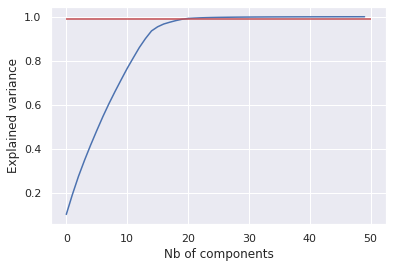

In [24]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.hlines(xmin=0, xmax=pca_components, y=0.99, colors='r')
plt.xlabel('Nb of components')
plt.ylabel('Explained variance')
plt.show()

In [25]:
np.where(np.cumsum(pca.explained_variance_ratio_) > 0.99)

(array([20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36,
        37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]),)

In [26]:
pca_components = np.where(np.cumsum(pca.explained_variance_ratio_) > 0.99)[0][0]
pca_components

20

In [27]:
pca = PCA(n_components=pca_components)
pca.fit(scl_bdd_ukb)
pca_ukb = pca.transform(scl_bdd_ukb)
pca_hcp = pca.transform(scl_bdd_hcp)
pca_troiani = pca.transform(scl_bdd_troiani)

Select a dataset on which the clustering study will be done

In [28]:
data = scl_bdd_ukb

In [278]:
"""
for i in range(15, 20):
    plt.hist(scl_bdd_accp[:,i], bins=35)
    plt.ylabel(f'Nb of subjects')
    plt.xlabel(f'Dim {i} values')
    plt.title(f'Dim {i} density')
    plt.show()
"""

"\nfor i in range(15, 20):\n    plt.hist(scl_bdd_accp[:,i], bins=35)\n    plt.ylabel(f'Nb of subjects')\n    plt.xlabel(f'Dim {i} values')\n    plt.title(f'Dim {i} density')\n    plt.show()\n"

Select the models for the clustering

In [29]:
clusterers = [
        "KMeans" ,
        "AgglomerativeClustering"
    ]

nb_clusters = 10

In [30]:
def calculate_clustering_scores(data, nb_clusters=nb_clusters):
    results = {}

    for name in clusterers:
        silhouette_scores = []
        calinski_harabasz_scores = []
        davies_bouldin_scores = []
        for i in range(2,nb_clusters+1):
            if name=="KMeans":
                model = KMeans(n_clusters=i, random_state=i, init="k-means++")
            if name=="AgglomerativeClustering":
                model = AgglomerativeClustering(n_clusters=i,)# metric="euclidean", linkage="ward")
            
            labels = model.fit_predict(data)
        
            sil_score = silhouette_score(data, labels)
            cal_score = calinski_harabasz_score(data, labels)
            dav_score = davies_bouldin_score(data, labels)
                
            silhouette_scores.append(sil_score)
            calinski_harabasz_scores.append(cal_score)
            davies_bouldin_scores.append(dav_score)

        results[name] = {"sil_score":silhouette_scores,
                         "cal_score":calinski_harabasz_scores,
                         "dav_score":davies_bouldin_scores}
        
    return results

In [31]:
results = calculate_clustering_scores(data,nb_clusters)

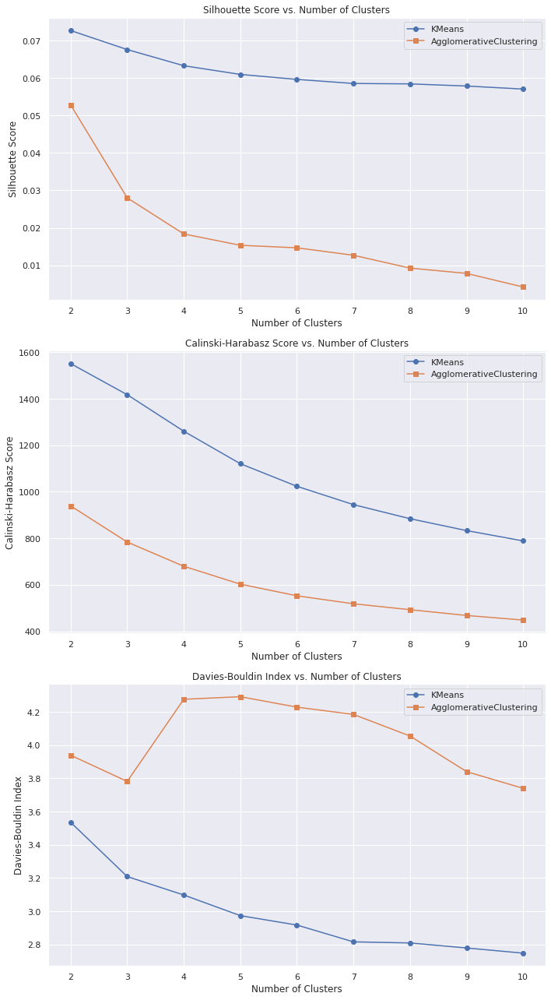

In [32]:
# Number of clusters
n_clusters_range = range(2,nb_clusters+1)

# Extracting the scores
kmeans_sil = results['KMeans']['sil_score']
kmeans_cal = results['KMeans']['cal_score']
kmeans_dav = results['KMeans']['dav_score']

agg_sil = results['AgglomerativeClustering']['sil_score']
agg_cal = results['AgglomerativeClustering']['cal_score']
agg_dav = results['AgglomerativeClustering']['dav_score']

# Plotting
fig, axes = plt.subplots(3, 1, figsize=(10, 18))

# Silhouette Score
axes[0].plot(n_clusters_range, kmeans_sil, label='KMeans', marker='o')
axes[0].plot(n_clusters_range, agg_sil, label='AgglomerativeClustering', marker='s')
axes[0].set_xlabel('Number of Clusters')
axes[0].set_ylabel('Silhouette Score')
axes[0].set_title('Silhouette Score vs. Number of Clusters')
axes[0].legend()
axes[0].set_xticks(n_clusters_range)

# Calinski-Harabasz Score
axes[1].plot(n_clusters_range, kmeans_cal, label='KMeans', marker='o')
axes[1].plot(n_clusters_range, agg_cal, label='AgglomerativeClustering', marker='s')
axes[1].set_xlabel('Number of Clusters')
axes[1].set_ylabel('Calinski-Harabasz Score')
axes[1].set_title('Calinski-Harabasz Score vs. Number of Clusters')
axes[1].legend()
axes[1].set_xticks(n_clusters_range)

# Davies-Bouldin Index
axes[2].plot(n_clusters_range, kmeans_dav, label='KMeans', marker='o')
axes[2].plot(n_clusters_range, agg_dav, label='AgglomerativeClustering', marker='s')
axes[2].set_xlabel('Number of Clusters')
axes[2].set_ylabel('Davies-Bouldin Index')
axes[2].set_title('Davies-Bouldin Index vs. Number of Clusters')
axes[2].legend()
axes[2].set_xticks(n_clusters_range)

plt.tight_layout()
plt.show()

Use a dimension reduction method so as to visualize the data in 2D

In [33]:
reducer = umap.UMAP()
reducer.fit(scl_bdd_ukb)

UMAP(tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True})

In [34]:
bdd_2D_HCP = reducer.transform(scl_bdd_hcp) #reducer.transform(scl_bdd_hcp)
bdd_2D_UKB = reducer.transform(scl_bdd_ukb) #reducer.transform(scl_bdd_ukb)
bdd_2D_troiani = reducer.transform(scl_bdd_troiani) #reducer.transform(scl_bdd_troiani)

bdd_2D_HCP = pd.DataFrame(bdd_2D_HCP, columns=['Dim 1', 'Dim 2'])
bdd_2D_UKB = pd.DataFrame(bdd_2D_UKB, columns=['Dim 1', 'Dim 2'])
bdd_2D_troiani = pd.DataFrame(bdd_2D_troiani, columns=['Dim 1', 'Dim 2'])

bdd_2D_HCP['Dataset'] = 'hcp'
bdd_2D_UKB['Dataset'] = 'UkBioBank'
bdd_2D_troiani['Dataset'] = 'troiani'

bdd_2D_HCP['ID'] = hcp.index
bdd_2D_UKB['ID'] = ukb.index
bdd_2D_UKB['ID'] = bdd_2D_UKB["ID"].apply(lambda x: x[4:])
bdd_2D_UKB['ID'] = bdd_2D_UKB["ID"].astype(int)
bdd_2D_troiani['ID'] = lbl_hcp.index

bdd_2D_troiani = pd.merge(left=bdd_2D_troiani, right=lbl_hcp, left_on='ID', right_on=lbl_hcp.index)
bdd_2D_troiani[['Left_OFC','Left_Subtype_OFC']] = bdd_2D_troiani[['Left_OFC','Left_Subtype_OFC']].astype(str)

In [67]:
from sklearn.svm import SVC

SVC_model = SVC(kernel='linear', probability=True,
            random_state=42,
            C=0.001, class_weight='balanced', decision_function_shape='ovr')

SVC_model.fit(X=scl_bdd_troiani, y=lbl_hcp.Left_OFC)

((SVC_model.predict(scl_bdd_troiani) == lbl_hcp.Left_OFC).sum())/len(lbl_hcp)

0.5753899480069324

In [68]:
bdd_2D_UKB['Left_OFC']=SVC_model.predict(scl_bdd_ukb)
bdd_2D_UKB['Left_OFC']=bdd_2D_UKB['Left_OFC'].astype(str)
bdd_2D_HCP['Left_OFC']=SVC_model.predict(scl_bdd_hcp)
bdd_2D_HCP['Left_OFC']=bdd_2D_HCP['Left_OFC'].astype(str)

In [59]:
def visualize_clusters(data, classes, title):
    
    fig = px.scatter(
        data, x='Dim 1', y='Dim 2', 
        color=classes,
        title=title,
        labels={'0': 'dim 1', '1': 'dim 2'},
        hover_data= ['Dataset', 'ID'],
        opacity=0.5,
        width=800, height=800
)
    fig.show()

<AxesSubplot:xlabel='Dim 1', ylabel='Dim 2'>

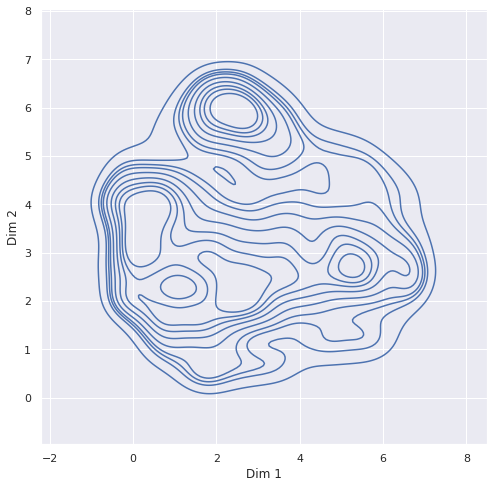

In [60]:
# Set up the figure
f, ax = plt.subplots(figsize=(8, 8))
#ax.set_aspect("equal")

# Draw a contour plot to represent each bivariate density
sns.kdeplot(
    data=bdd_2D_UKB,
    x="Dim 1",
    y="Dim 2",
    thresh=.1,
)

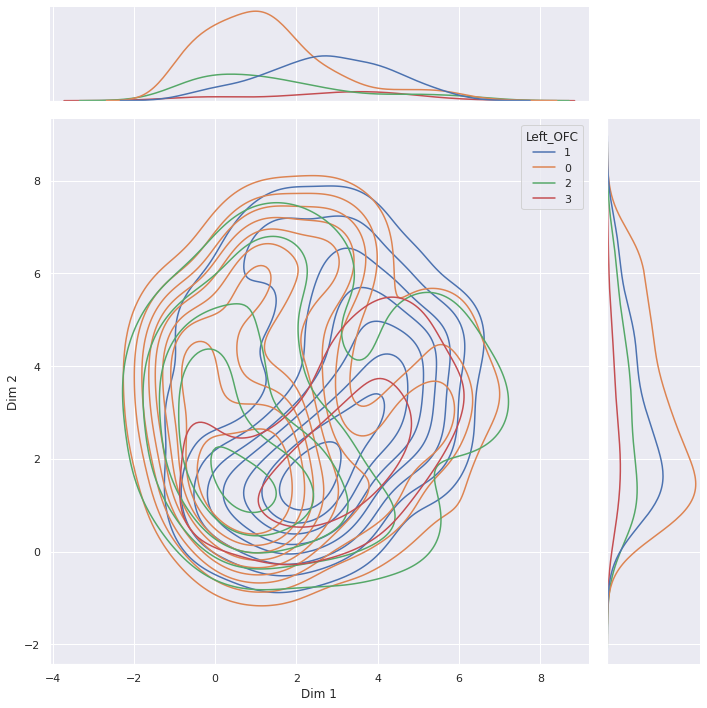

In [69]:
sns.jointplot(
    data=bdd_2D_troiani,
    x="Dim 1", y="Dim 2", hue="Left_OFC",
    kind="kde",
    height=10, 
    ratio=5
)

In [70]:
visualize_clusters(bdd_2D_UKB, 'Left_OFC', 'UKB orbital patterns')

#### Let's see the accuracy of the automatic clustering regarding to the prediction of having a PCS as the ground truth.

In [61]:
def plot_matching_labels(True_labels, auto_labels):
    conf_matrix = confusion_matrix(True_labels, auto_labels)
    conf_matrix = conf_matrix[:len(np.unique(True_labels)), :len(np.unique(auto_labels))]

    # Convert the confusion matrix to a DataFrame for better readability
    conf_df = pd.DataFrame(conf_matrix, index=[f'{i}' for i in np.unique(True_labels)],
                        columns=[f'{i}' for i in np.unique(auto_labels)])

    # Calculate percentages
    conf_df_percent = conf_df.div(conf_df.sum(axis=0), axis=1) * 100

    plt.figure(figsize=(12, 4))
    sns.heatmap(conf_df_percent, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Percentage'})
    plt.title('Percentage of Subjects Automatically Classified Matching the Different Classes')
    plt.xlabel('Automatic Labels')
    plt.ylabel('Ground truth')
    plt.show()

    return conf_df

On UKB:

In [71]:
agglo_model = AgglomerativeClustering(4)
agglo_labels = agglo_model.fit_predict(data)

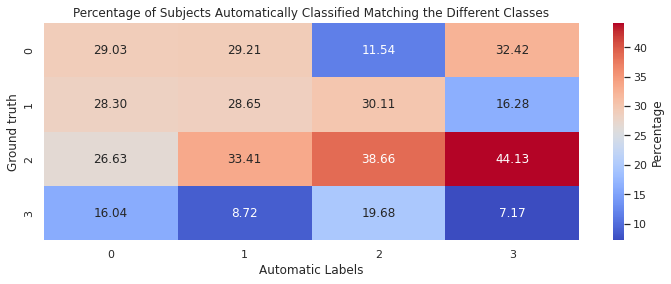

In [72]:
orbital_labels = bdd_2D_UKB['Left_OFC'].astype(int).to_numpy()

a=plot_matching_labels(orbital_labels, agglo_labels)

In [73]:
visualize_clusters(bdd_2D_UKB, agglo_labels.astype('str'), 'UKB left Agglomerative clustering')

In [74]:
bdd_2D_UKB['Auto_clust'] = agglo_labels.astype('str')

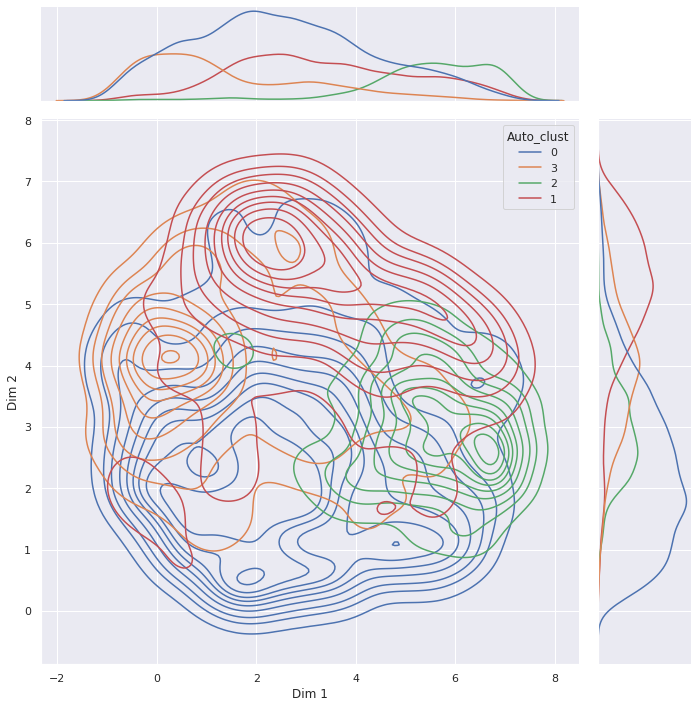

In [75]:
sns.jointplot(
    data=bdd_2D_UKB,
    x="Dim 1", y="Dim 2", hue="Auto_clust",
    kind="kde",
    height=10, 
    ratio=5
)

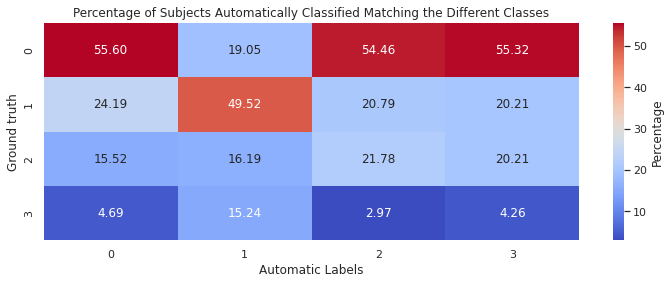

In [78]:
automatic_labels = agglo_model.fit_predict(scl_bdd_troiani)
a=plot_matching_labels(bdd_2D_troiani['Left_OFC'].astype(int).to_numpy() , automatic_labels)

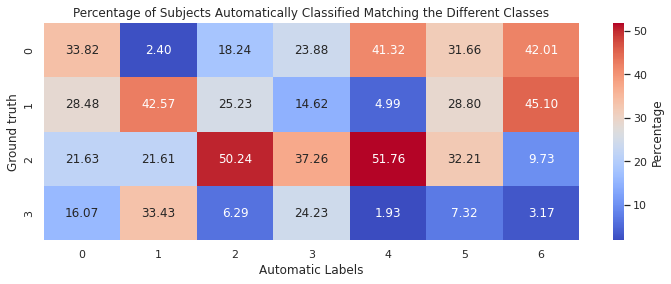

In [79]:
kmeans_model = KMeans(n_clusters=7, init='k-means++', max_iter=500, n_init=1)
kmeans_labels = kmeans_model.fit_predict(data)

a=plot_matching_labels(bdd_2D_UKB['Left_OFC'].astype(int).to_numpy() , kmeans_labels)

In [80]:
visualize_clusters(bdd_2D_UKB, kmeans_labels.astype('str'), 'UKB left KMEANS clustering')

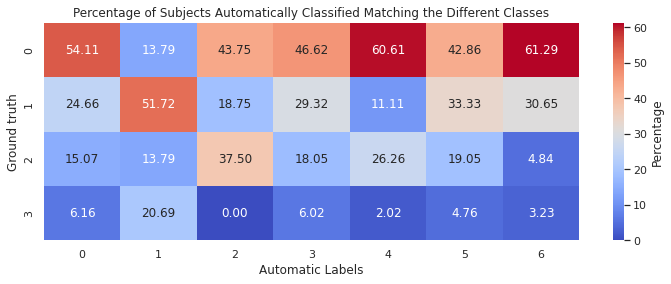

In [81]:
automatic_labels = kmeans_model.predict(scl_bdd_troiani)

a=plot_matching_labels(bdd_2D_troiani['Left_OFC'].astype(int).to_numpy() , automatic_labels)

Percentage of matching labels for the kmeans and agglomerative methods:

In [82]:
adjusted_rand_score(agglo_labels, kmeans_labels)

0.1514492423966329

#### Let's see the stability of the KMEANS method on one embedding

For 2 clusters, the adjusted rand scores for 10 KMEANS models give:
Mean Adjusted Rand Score for 2 clusters: 0.5573


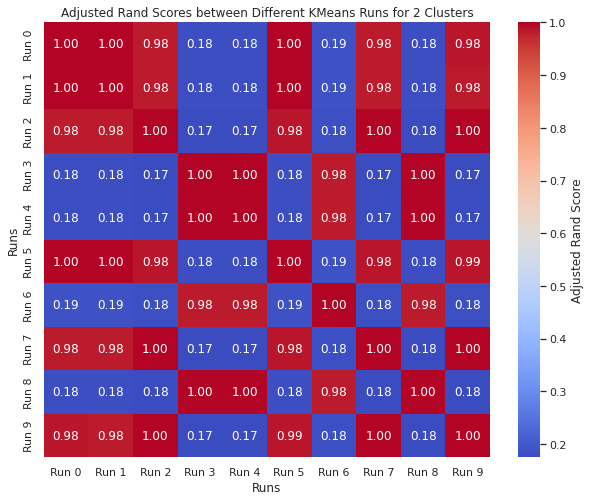

For 3 clusters, the adjusted rand scores for 10 KMEANS models give:
Mean Adjusted Rand Score for 3 clusters: 0.9634


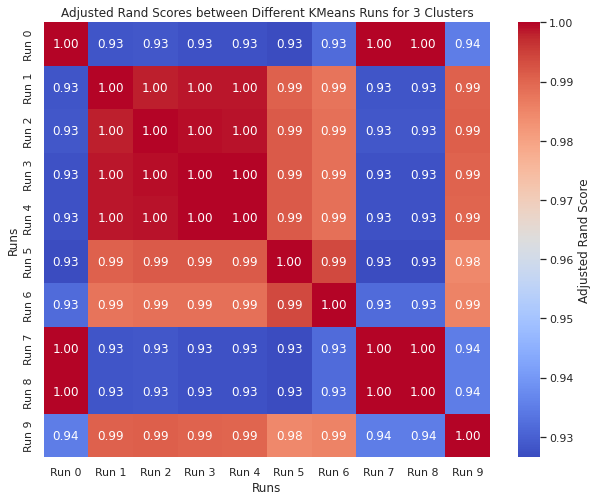

For 4 clusters, the adjusted rand scores for 10 KMEANS models give:
Mean Adjusted Rand Score for 4 clusters: 0.9412


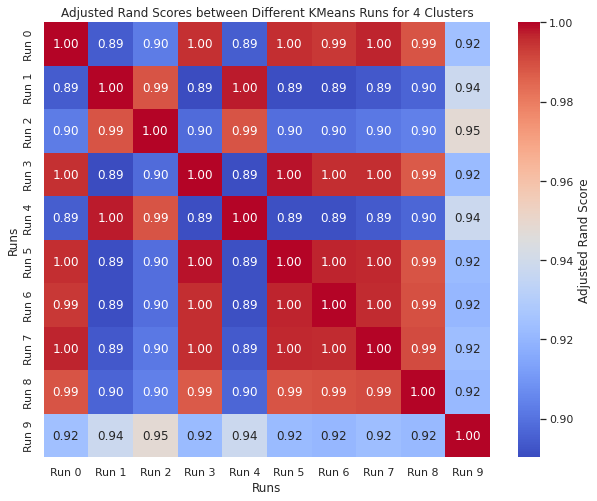

For 5 clusters, the adjusted rand scores for 10 KMEANS models give:
Mean Adjusted Rand Score for 5 clusters: 0.7039


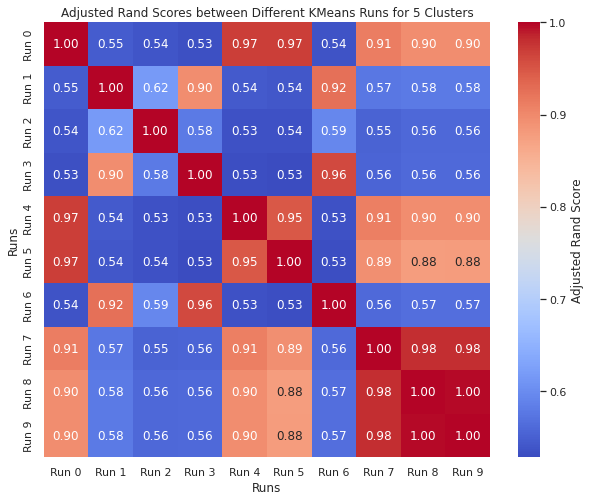

For 6 clusters, the adjusted rand scores for 10 KMEANS models give:
Mean Adjusted Rand Score for 6 clusters: 0.7770


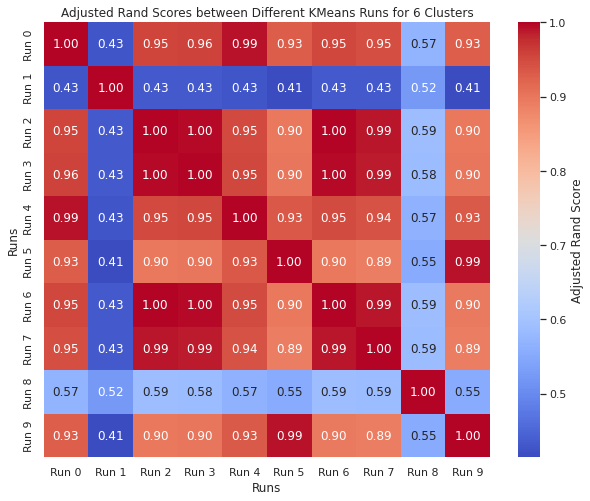

For 7 clusters, the adjusted rand scores for 10 KMEANS models give:
Mean Adjusted Rand Score for 7 clusters: 0.5867


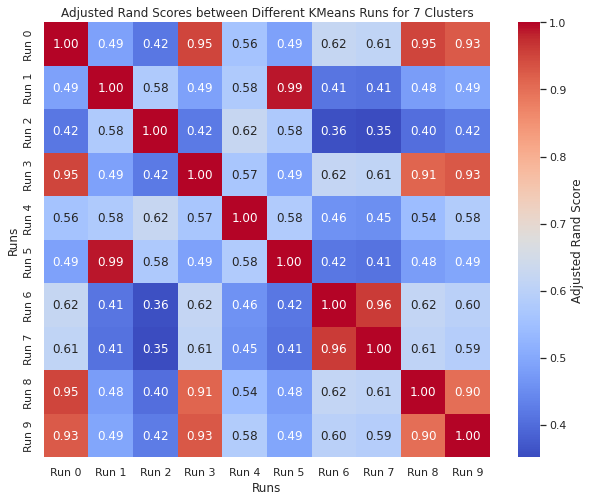

For 8 clusters, the adjusted rand scores for 10 KMEANS models give:
Mean Adjusted Rand Score for 8 clusters: 0.5064


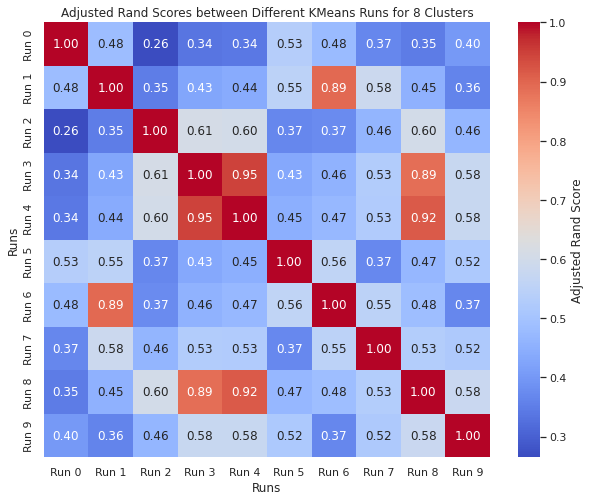

For 9 clusters, the adjusted rand scores for 10 KMEANS models give:
Mean Adjusted Rand Score for 9 clusters: 0.5554


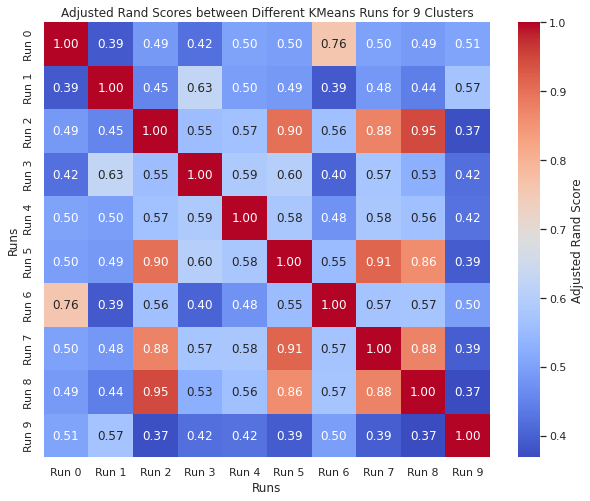

For 10 clusters, the adjusted rand scores for 10 KMEANS models give:
Mean Adjusted Rand Score for 10 clusters: 0.4975


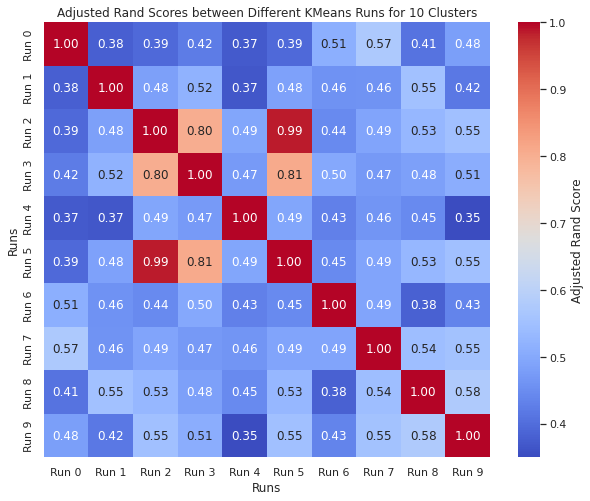

In [84]:
for nb_cl in range(2, 11):
    print(f"For {nb_cl} clusters, the adjusted rand scores for 10 KMEANS models give:")
    
    # Define the KMeans model
    kmeans_model = KMeans(n_clusters=nb_cl, init='k-means++', max_iter=500, n_init=1)

    # Store the labels from each run
    labels_list = []

    # Perform 10 runs with different initializations
    for i in range(10):
        kmeans_model.fit(data)
        labels_list.append(kmeans_model.labels_)

    # Calculate adjusted Rand scores for each pair of runs
    rand_scores = np.zeros((10, 10))

    for i in range(10):
        for j in range(i, 10):
            score = adjusted_rand_score(labels_list[i], labels_list[j])
            rand_scores[i, j] = score
            rand_scores[j, i] = score

    # Convert to DataFrame for better readability
    rand_scores_df = pd.DataFrame(rand_scores, columns=[f'Run {i}' for i in range(10)],
                                  index=[f'Run {i}' for i in range(10)])

    # Extract the upper diagonal part of the matrix
    upper_diag_scores = rand_scores[np.triu_indices(10, k=1)]

    # Calculate the mean of the upper diagonal part
    mean_upper_diag_score = np.mean(upper_diag_scores)
    print(f"Mean Adjusted Rand Score for {nb_cl} clusters: {mean_upper_diag_score:.4f}")

    # Plot the heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(rand_scores_df, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Adjusted Rand Score'})
    plt.title(f'Adjusted Rand Scores between Different KMeans Runs for {nb_cl} Clusters')
    plt.xlabel('Runs')
    plt.ylabel('Runs')
    plt.show()

#### Let's see the stability of the agglomerative clustering on different embeddings

In [96]:
rootpath_dic = {}
orbital_path='/neurospin/dico/data/deep_folding/current/models/Champollion_V0/ORBITAL_left'
for i,directory in enumerate(os.listdir(orbital_path)):
    rootpath_dic[f"root_path{i}"]=f"{orbital_path}"

In [97]:
rootpath_dic

{'root_path0': '/neurospin/dico/data/deep_folding/current/models/Champollion_V0/ORBITAL_left',
 'root_path1': '/neurospin/dico/data/deep_folding/current/models/Champollion_V0/ORBITAL_left',
 'root_path2': '/neurospin/dico/data/deep_folding/current/models/Champollion_V0/ORBITAL_left',
 'root_path3': '/neurospin/dico/data/deep_folding/current/models/Champollion_V0/ORBITAL_left',
 'root_path4': '/neurospin/dico/data/deep_folding/current/models/Champollion_V0/ORBITAL_left'}

In [98]:
embeddings = {}

for i in tqdm(range(len(rootpath_dic))):
    
    root_path = rootpath_dic[f'root_path{i}']
    embeddings[f'ukb_{i}'] = pd.read_csv(f'{root_path}/{directory}/ukb_random_embeddings_best_model/full_embeddings.csv', index_col=0)
    
    scaler = StandardScaler()

    scaler.fit(embeddings[f'ukb_{i}'])
    embeddings[f'scl_ukb_{i}'] = scaler.transform(embeddings[f'ukb_{i}'])
    
    pca_components = 50
    pca = PCA(n_components=pca_components)

    pca.fit(embeddings[f'scl_ukb_{i}'])
    pca_components = np.where(np.cumsum(pca.explained_variance_ratio_) > 0.99)[0][0]
    pca = PCA(n_components=pca_components)
    pca.fit(embeddings[f'scl_ukb_{i}'])
    embeddings[f'pca_ukb_{i}'] = pca.transform(embeddings[f'scl_ukb_{i}'])

100%|██████████| 5/5 [00:09<00:00,  1.93s/it]


For 2 clusters, the adjusted rand scores for 5 embeddings give:


100%|██████████| 5/5 [00:02<00:00,  1.75it/s]


Mean Adjusted Rand Score for 2 clusters: 0.9931


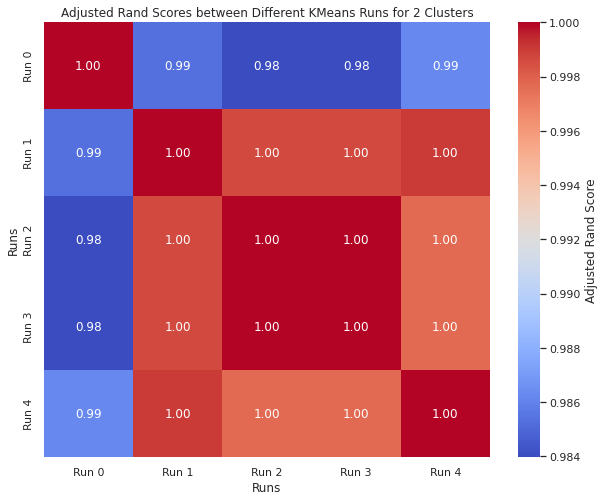

For 3 clusters, the adjusted rand scores for 5 embeddings give:


100%|██████████| 5/5 [00:02<00:00,  1.72it/s]


Mean Adjusted Rand Score for 3 clusters: 0.7096


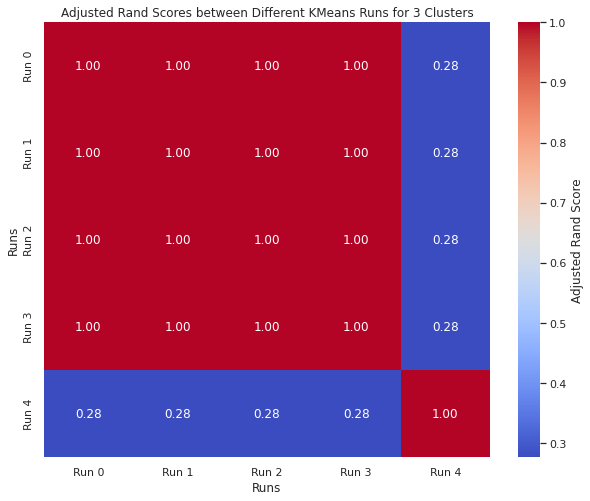

For 4 clusters, the adjusted rand scores for 5 embeddings give:


100%|██████████| 5/5 [00:02<00:00,  2.15it/s]


Mean Adjusted Rand Score for 4 clusters: 0.7576


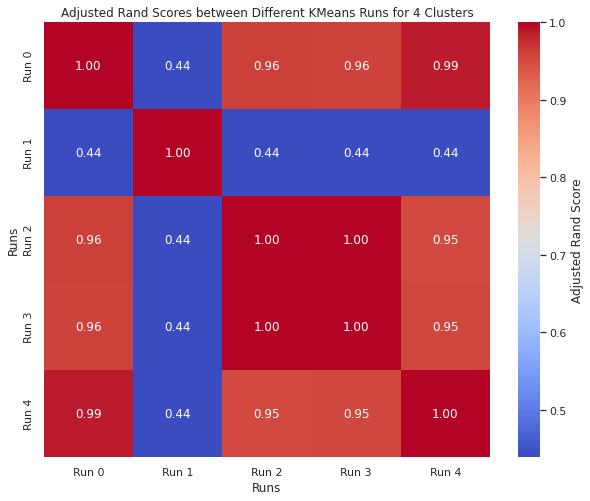

For 5 clusters, the adjusted rand scores for 5 embeddings give:


100%|██████████| 5/5 [00:02<00:00,  2.22it/s]


Mean Adjusted Rand Score for 5 clusters: 0.6318


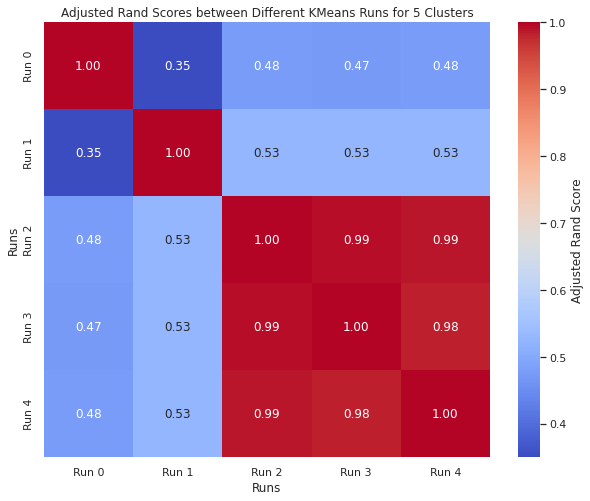

For 6 clusters, the adjusted rand scores for 5 embeddings give:


100%|██████████| 5/5 [00:02<00:00,  1.88it/s]


Mean Adjusted Rand Score for 6 clusters: 0.6033


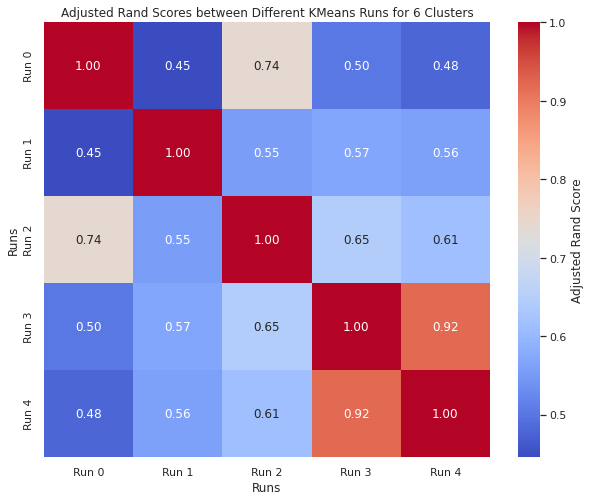

For 7 clusters, the adjusted rand scores for 5 embeddings give:


100%|██████████| 5/5 [00:02<00:00,  1.86it/s]


Mean Adjusted Rand Score for 7 clusters: 0.6505


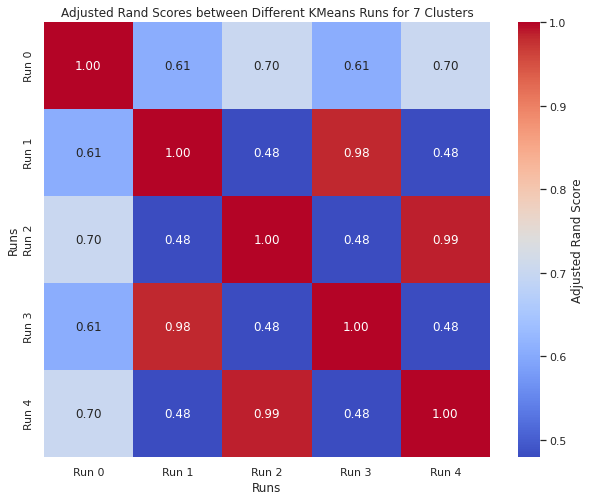

For 8 clusters, the adjusted rand scores for 5 embeddings give:


100%|██████████| 5/5 [00:03<00:00,  1.55it/s]


Mean Adjusted Rand Score for 8 clusters: 0.5540


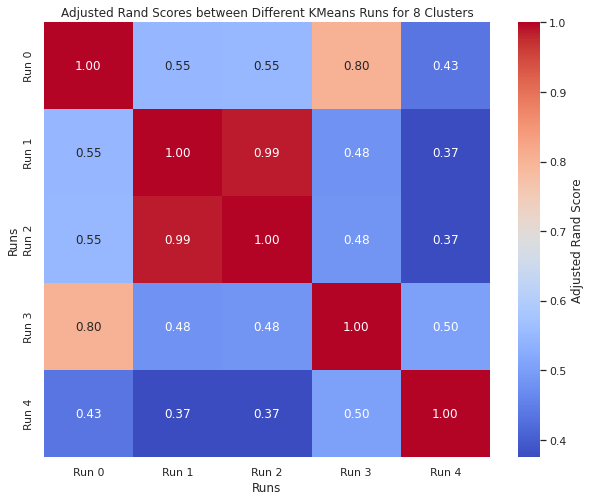

For 9 clusters, the adjusted rand scores for 5 embeddings give:


100%|██████████| 5/5 [00:03<00:00,  1.54it/s]


Mean Adjusted Rand Score for 9 clusters: 0.6662


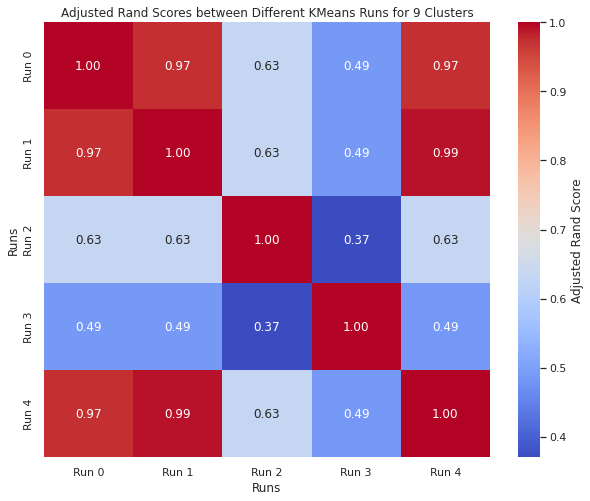

In [100]:
nb_ebdd = len(rootpath_dic)

for nb_cl in range(2, 10):
    print(f"For {nb_cl} clusters, the adjusted rand scores for 5 embeddings give:")
    
    # Define the KMeans model
    #agglo_model = AgglomerativeClustering(n_clusters=nb_cl)
    agglo_model = KMeans(n_clusters=nb_cl, init='k-means++', max_iter=500, n_init=1)

    # Store the labels from each run
    labels_list = []

    # Perform 5 runs with different embeddings
    for mbb_i in tqdm(range(nb_ebdd)):

        data = embeddings[f'scl_ukb_{mbb_i}']
        #data = embeddings[f'pca_ukb_{mbb_i}']
        agglo_model.fit(data)
        labels_list.append(agglo_model.labels_)

    # Calculate adjusted Rand scores for each pair of runs
    rand_scores = np.zeros((nb_ebdd, nb_ebdd))

    for i in range(nb_ebdd):
        for j in range(i, nb_ebdd):
            score = adjusted_rand_score(labels_list[i], labels_list[j])
            rand_scores[i, j] = score
            rand_scores[j, i] = score

    # Convert to DataFrame for better readability
    rand_scores_df = pd.DataFrame(rand_scores, columns=[f'Run {i}' for i in range(nb_ebdd)],
                                  index=[f'Run {i}' for i in range(nb_ebdd)])

    # Extract the upper diagonal part of the matrix
    upper_diag_scores = rand_scores[np.triu_indices(nb_ebdd, k=1)]

    # Calculate the mean of the upper diagonal part
    mean_upper_diag_score = np.mean(upper_diag_scores)
    print(f"Mean Adjusted Rand Score for {nb_cl} clusters: {mean_upper_diag_score:.4f}")

    # Plot the heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(rand_scores_df, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Adjusted Rand Score'})
    plt.title(f'Adjusted Rand Scores between Different KMeans Runs for {nb_cl} Clusters')
    plt.xlabel('Runs')
    plt.ylabel('Runs')
    plt.show()